In [49]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = "."
# CHAPTER_ID = "unsupervised_learning"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images")
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="jpg", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

In [3]:
from sklearn.cluster import KMeans

In [13]:
# Download the image
images_path = os.path.join(PROJECT_ROOT_DIR, "images")
os.makedirs(images_path, exist_ok=True)
# DOWNLOAD_ROOT = "https://raw.githubusercontent.com/ageron/handson-ml2/master/"
filename = "Portrait.jpg"
print("Downloading", filename)
from matplotlib.image import imread
image = imread(os.path.join(images_path, filename))
image.shape

(4032, 2268, 3)

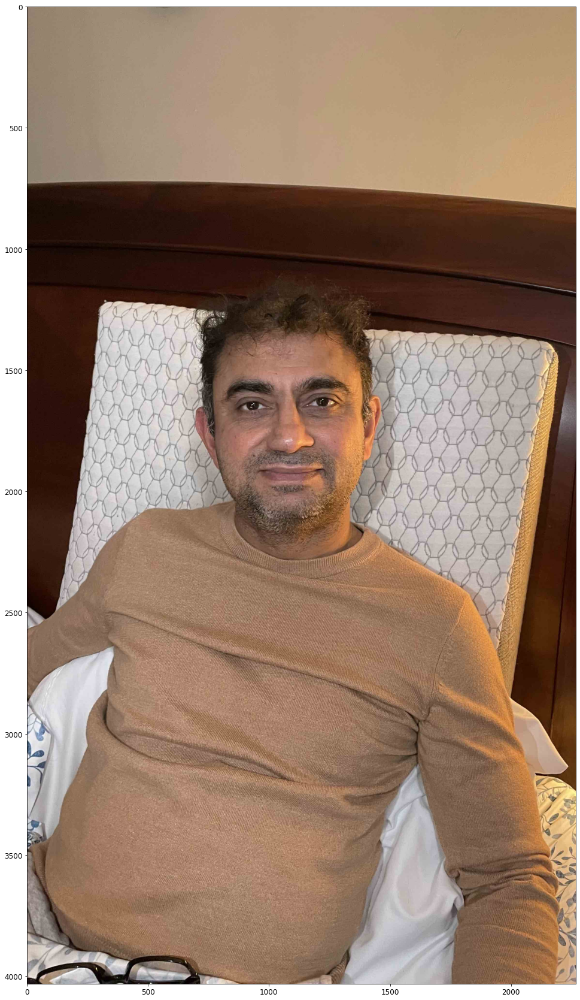

In [14]:
plt.figure(figsize=(30,30))
plt.imshow(image)

In [15]:
X = image.reshape(-1, 3)
print(f"X.shape: {X.shape}")
kmeans = KMeans(n_clusters=8, random_state=42).fit(X)
kmeans.cluster_centers_.shape

X.shape: (9144576, 3)


(8, 3)

In [16]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 2)
X2D = pca.fit_transform(X)
X2D.shape

(9144576, 2)

5440it [00:11, 463.11it/s]


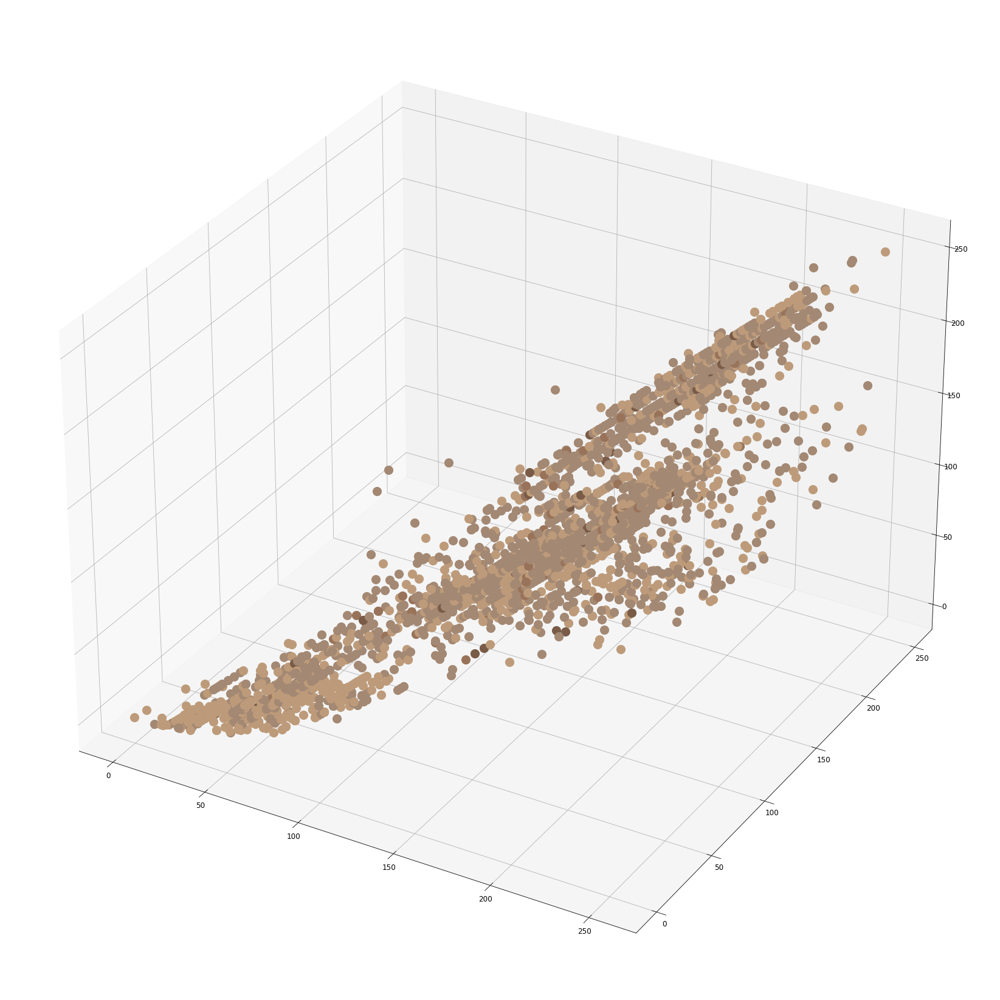

In [17]:
from tqdm import tqdm

fig = plt.figure(figsize=(30,30))
ax = fig.add_subplot(projection='3d')

# kmeans.cluster_centers_[kmeans.labels_[0]]
for i, pix in tqdm(enumerate(X[::1681])):
    clr = kmeans.cluster_centers_[kmeans.labels_[i]] / 255
    ax.scatter(*pix, marker='o', color=clr, s=200)
    
plt.show()

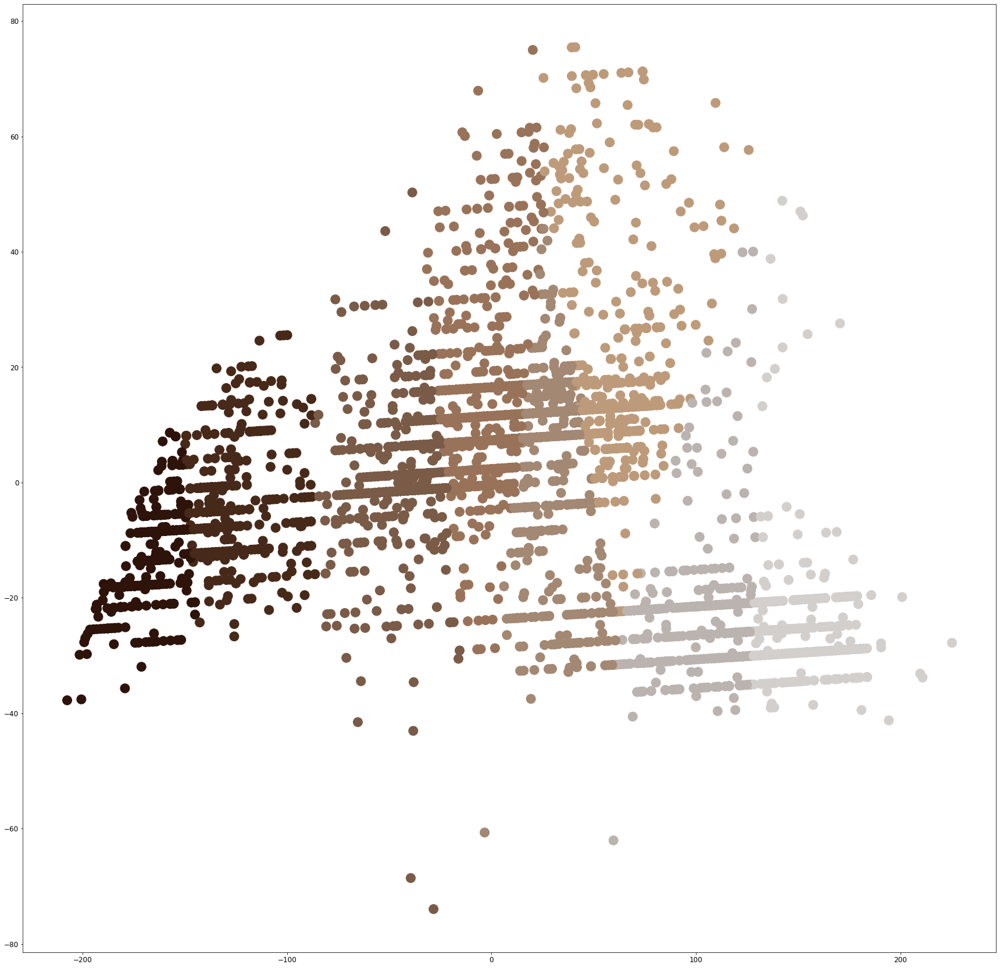

In [18]:
fig = plt.figure(figsize=(30,30))
clrs = kmeans.cluster_centers_[kmeans.labels_] / 255

plt.scatter(X2D[::1681,0], X2D[::1681,1], marker='o', color=clrs[::1681], s=255)
    
# plt.show()

In [19]:
segmented_img = kmeans.cluster_centers_[kmeans.labels_]
segmented_img = segmented_img.reshape(image.shape)

In [20]:
segmented_imgs = []
n_colors = (10, 8, 6, 4, 2)
for n_clusters in n_colors:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(X)
    segmented_img = kmeans.cluster_centers_[kmeans.labels_]
    segmented_imgs.append(segmented_img.reshape(image.shape))

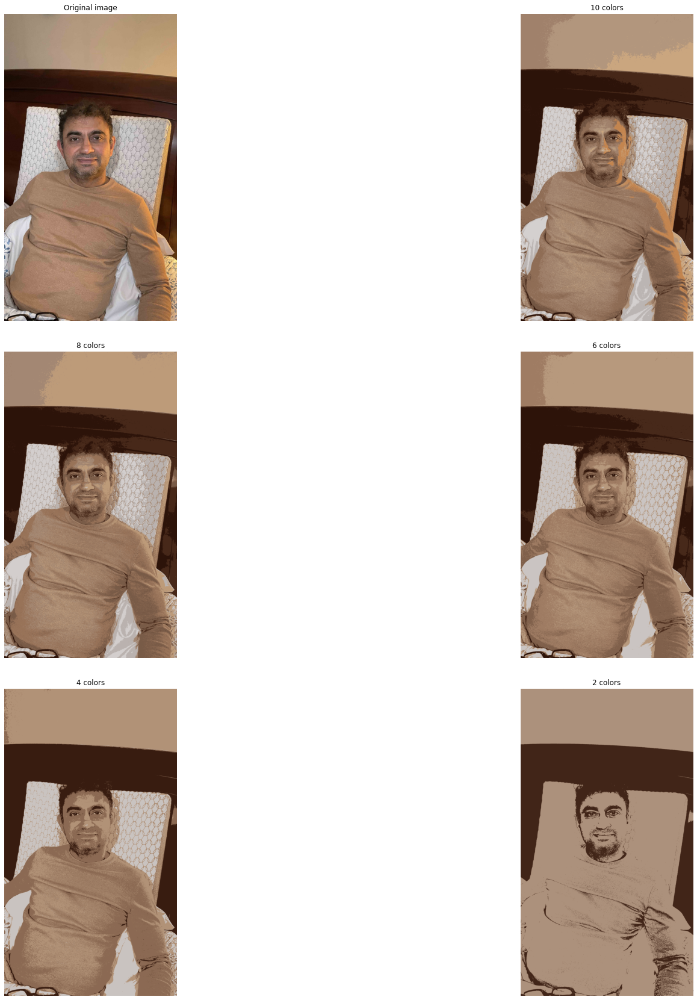

In [21]:
plt.figure(figsize=(30,30))
plt.subplots_adjust(wspace=0.05, hspace=0.1)

plt.subplot(321)
plt.imshow(image)
plt.title("Original image")
plt.axis('off')

for idx, n_clusters in enumerate(n_colors):
    plt.subplot(322 + idx)
    plt.imshow(segmented_imgs[idx] / 255)
    plt.title("{} colors".format(n_clusters))
    plt.axis('off')

plt.show()

In [22]:
# Download the image
images_path = os.path.join(PROJECT_ROOT_DIR, "images")
os.makedirs(images_path, exist_ok=True)
# DOWNLOAD_ROOT = "https://raw.githubusercontent.com/ageron/handson-ml2/master/"
filename = "Choco.jpg"
print("Downloading", filename)
from matplotlib.image import imread
image = imread(os.path.join(images_path, filename))
image.shape

(1394, 1394, 3)

In [38]:
print(f"Number of unique colors: {len(np.unique(X, axis=0))}")
print(f"Total number of pixels: {X.size // 3}")
print(f"Percent of total pallette coverage: {len(np.unique(X, axis=0)) / 256**3 * 100}")

Number of unique colors: 33398
Total number of pixels: 1943236
Percent of total pallette coverage: 0.1990675926208496


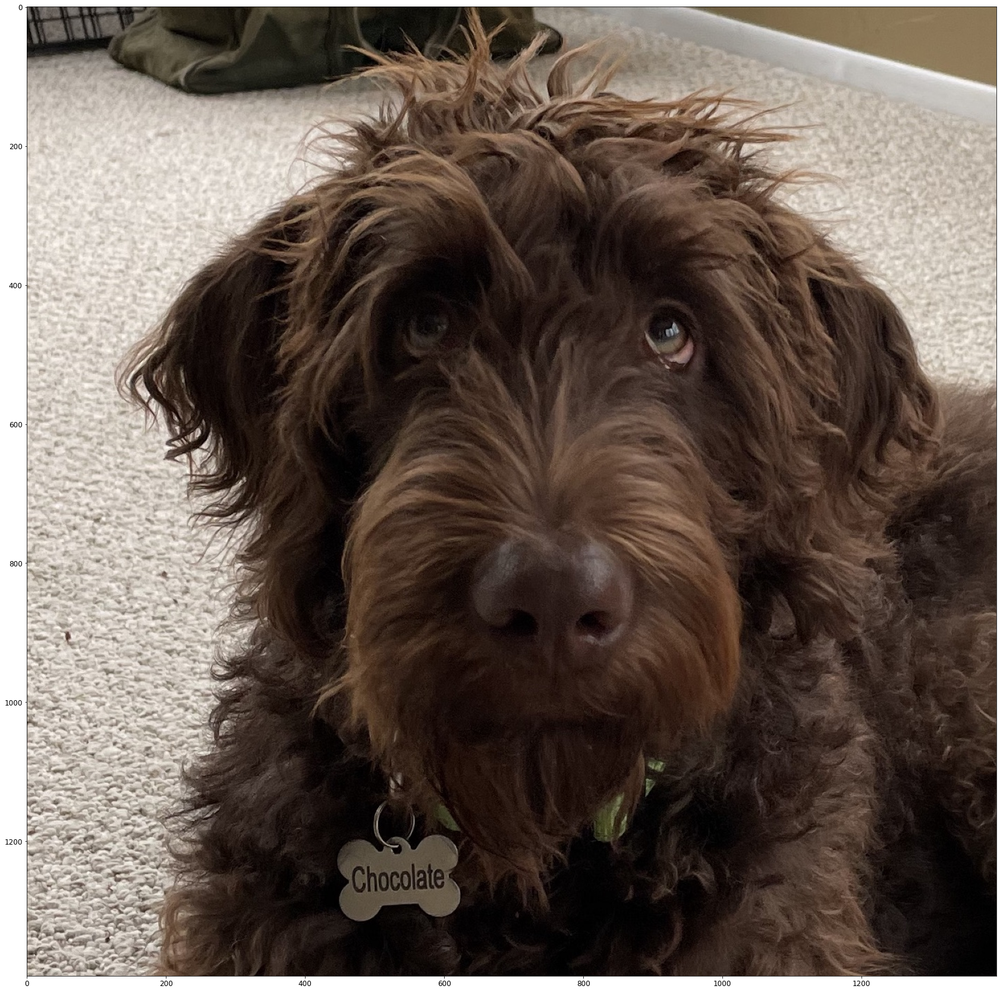

In [23]:
plt.figure(figsize=(30,30))
plt.imshow(image)

In [42]:
X = image.reshape(-1, 3)
print(f"X.shape: {X.shape}")
kmeans = KMeans(n_clusters=8, random_state=42).fit(X)
kmeans.cluster_centers_.shape

X.shape: (1943236, 3)


(8, 3)

In [25]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 2)
X2D = pca.fit_transform(X)
X2D.shape

(1943236, 2)

1156it [00:03, 332.85it/s]


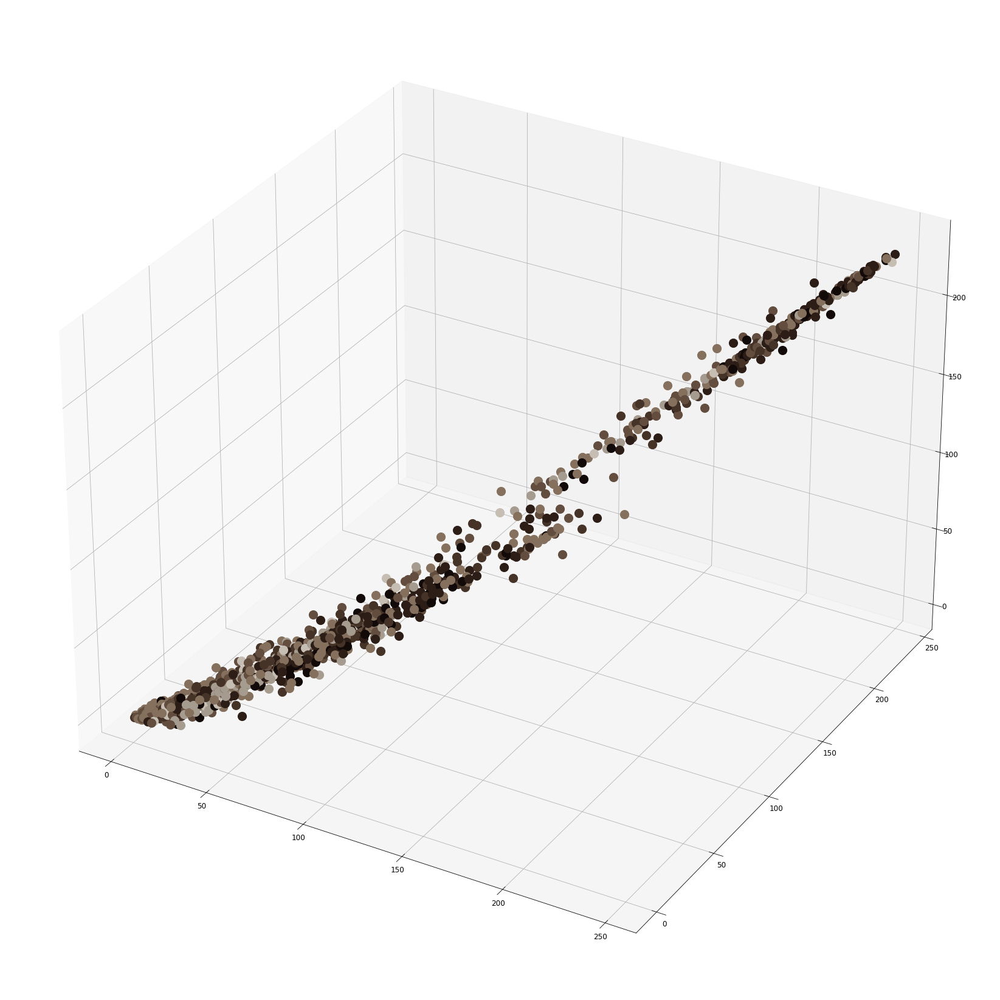

In [26]:
from tqdm import tqdm

fig = plt.figure(figsize=(30,30))
ax = fig.add_subplot(projection='3d')

# kmeans.cluster_centers_[kmeans.labels_[0]]
for i, pix in tqdm(enumerate(X[::1681])):
    clr = kmeans.cluster_centers_[kmeans.labels_[i]] / 255
    ax.scatter(*pix, marker='o', color=clr, s=200)
    
plt.show()

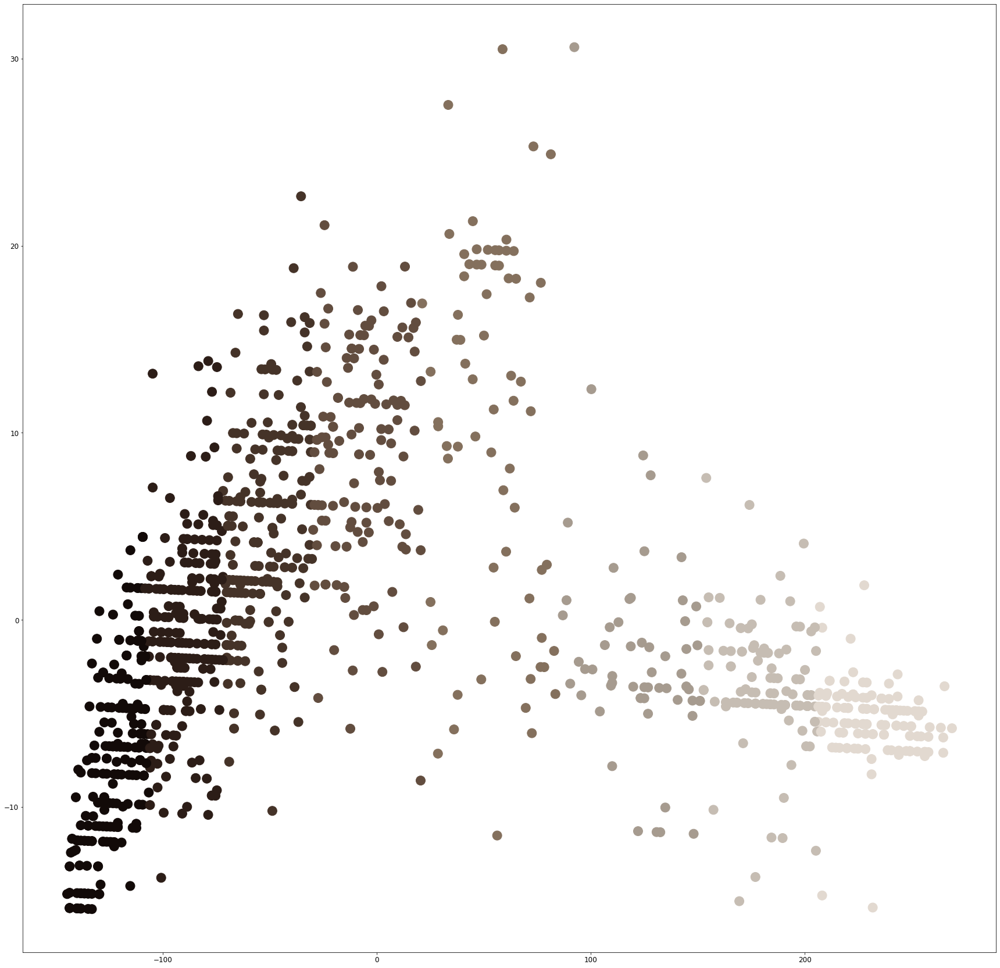

In [27]:
fig = plt.figure(figsize=(30,30))
clrs = kmeans.cluster_centers_[kmeans.labels_] / 255

plt.scatter(X2D[::1681,0], X2D[::1681,1], marker='o', color=clrs[::1681], s=255)
    
# plt.show()

In [43]:
segmented_img = kmeans.cluster_centers_[kmeans.labels_]
segmented_img = segmented_img.reshape(image.shape)

In [29]:
segmented_imgs = []
n_colors = (10, 8, 6, 4, 2)
for n_clusters in n_colors:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(X)
    segmented_img = kmeans.cluster_centers_[kmeans.labels_]
    segmented_imgs.append(segmented_img.reshape(image.shape))

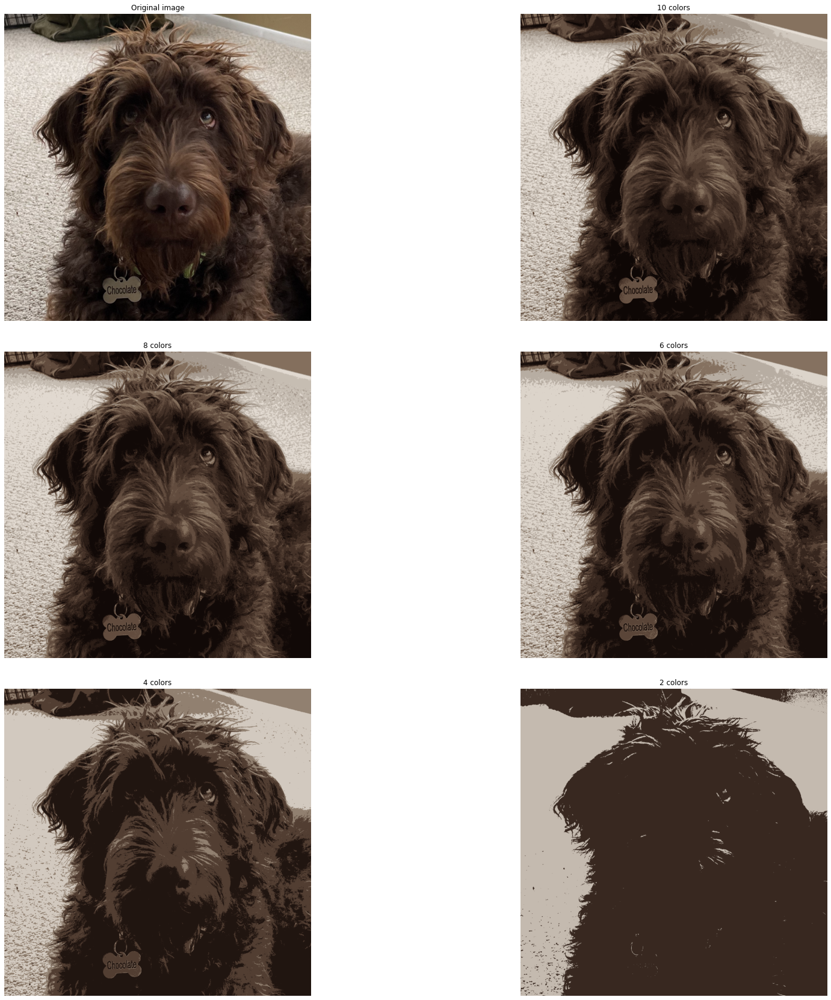

In [30]:
plt.figure(figsize=(30,30))
plt.subplots_adjust(wspace=0.05, hspace=0.1)

plt.subplot(321)
plt.imshow(image)
plt.title("Original image")
plt.axis('off')

for idx, n_clusters in enumerate(n_colors):
    plt.subplot(322 + idx)
    plt.imshow(segmented_imgs[idx] / 255)
    plt.title("{} colors".format(n_clusters))
    plt.axis('off')

plt.show()

Saving figure Choco10Color


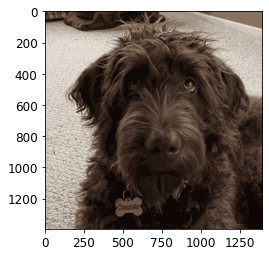

In [51]:
plt.imshow(segmented_imgs[0] / 255)
save_fig("Choco10Color", tight_layout=False)

In [53]:
print(len(np.unique(segmented_imgs[0].reshape(-1,3), axis=0)))

10
